In [2]:
import imp
tm = imp.load_source('totalShadeMask.py', '../Utils/totalShadeMask.py')

/var/folders/sp/p58zvn2x0j74k4wxmrwnyh7h0000gn/T/ipykernel_23548/2881837357.py:1: DeprecationWarning: the imp module is deprecated in favour of importlib and slated for removal in Python 3.12; see the module's documentation for alternative uses
  import imp


In [3]:
mp = imp.load_source('MercatorProjection.py', '../MapSegmentation/MercatorProjection.py')
intersect = imp.load_source('checkIntersection.py', '../Utils/checkIntersection.py')
import osm2gmns as og
import pandas as pd
import numpy as np
import os as os
import cv2;
import matplotlib.pyplot as plt
import requests
import json
from collections import OrderedDict
import math
import copy

osm2gmns, 0.7.3


## Getting the OSM file

In [4]:
# For now, not using this
# og.downloadOSMData(3444656, 'map.osm')

input_file = 'map (1).osm'
net = og.getNetFromFile(input_file, network_types=('walk'))
# Use og.show(net) to visualize the network model
# og.show(net)

arguments used for network parsing:
  filename: map (1).osm
  network_types: walk
  link_types: all
  POI: False
  POI_sampling_ratio: 1.0
  strict_mode: True
  offset: no
  min_nodes: 1
  combine: False
  bbox: None
  default_lanes: False
  default_speed: False
  default_capacity: False
  start_node_id: 0
  start_link_id: 0

Building Network from OSM file
  reading osm file
  parsing osm network
    generating nodes and links
  number of nodes: 420, number of links: 782, number of pois: 0


In [5]:
og.outputNetToCSV(net) #net

Outputting Network Files


## Getting the image

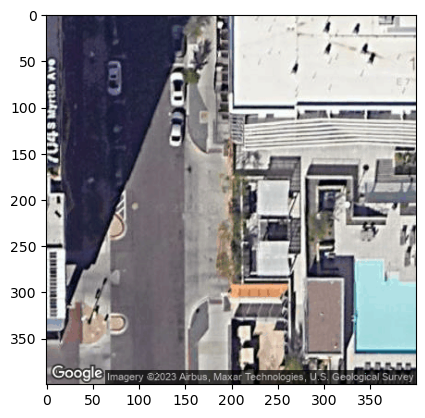

In [6]:
dirPath = os.path.join('..', 'MapSegmentation', 'DataSetByeng');
imgIndex = '7-7';
imgPath = 'img' + imgIndex + '.png';
imgPath = os.path.join(dirPath, imgPath);
combinedImage = cv2.imread(imgPath);
combinedImage = cv2.cvtColor(combinedImage, cv2.COLOR_BGR2RGB)
plt.imshow(combinedImage)

## Getting image data - centre and edge coordinates.

In [7]:
# Getting centre coordinates of this image through image directory:-
imgDirPath = os.path.join(dirPath, "imageDirectory");
f = open(imgDirPath);
imgData = json.load(f)

imgCoords = imgData['imageIndex'][f"{7}_{7}"];

In [8]:
imgCoords

{'lat': 33.42279370098351, 'long': -111.93804134918213}

In [9]:
# Preparing to get the corner coordinates for that image:-
areaCoords = imgData["coordinates"];
latTop = areaCoords['latTop'];
longLeft = areaCoords['longLeft'];
imgSize = imgData["imageSize"];
zoom = imgData["zoom"];
[SWlat, SWlng, NElat, NElng] = mp.getImageBounds(imgSize, zoom, latTop, longLeft)

In [10]:
# Factors with which to increase lat and long for each image
latFactor = latTop - SWlat
longFactor = longLeft - SWlng
print(latFactor, longFactor)

0.0002238582513740539 0.0002682209014892578


In [11]:
# Getting the corners for an image
imgLatTop = imgCoords["lat"] + latFactor/2;
imgLatBot = imgCoords["lat"] - latFactor/2;
imgLongLeft = imgCoords["long"] - longFactor/2;
imgLongRight = imgCoords["long"] + longFactor/2;
print(imgLatTop)
print(imgLatBot)
print(imgLongLeft)
print(imgLongRight)

33.4229056301092
33.422681771857825
-111.93817545963287
-111.93790723873138


## Converting all Linestrings in Links array to list of actual coordinates.

In [12]:
link_dataframe = pd.read_csv("link.csv")

In [13]:
links = link_dataframe.to_numpy()

In [14]:
for link in links:
    coords = link[12][12:-1].split(',');
    for i in range(len(coords)):
        coords[i] = coords[i].split();
        coords[i] = [float(coords[i][1]), float(coords[i][0])];
        link[12] = coords
    

In [15]:
links[0]

array(['West 6th Street', 0, 5591085, 0, 1, 1, 18.04, 1.0, 40.0, nan,
       'residential', 6,
       list([[33.4243385, -111.9412691], [33.4243393, -111.941075]]),
       'walk', 1, 0, nan, nan], dtype=object)

### Here, we traverse over roads in link.csv. Using the end points of the link, we then find the coordinates of the end points using node.csv. Then, we find an equation of the line connecting those two coordinates. And if points on that line pass through our image, implies the path passes through our image.

In [16]:
link_dataframe = pd.read_csv("link.csv")
node_dataframe = pd.read_csv("node.csv")

In [17]:
links = link_dataframe.to_numpy();
nodes = node_dataframe.to_numpy();

In [18]:
# Creating a dictionary of nodes and their coordinates
nodeCoordDict = {}
for node in nodes:
    nodeNum = node[1];
    nodeXCoord = node[10];
    nodeYCoord= node[9];
    nodeCoordDict[nodeNum] = [nodeXCoord, nodeYCoord];


### In each image, we check what all link IDs are present. Then, we check their corresponding path names.

In [19]:
# Creating a dictionary of end nodes, and the path.
endNodesOfPath = {};
for link in links:
    nodeTuple = (link[3], link[4]);
    nodeTuple = tuple(sorted(nodeTuple))
    pathName = link[0];
    endNodesOfPath[nodeTuple] = pathName;

In [20]:
# Creating a dictionary of end nodes, and the linkID.
endNodesOfLinkID = {};
for link in links:
    nodeTuple = (link[3], link[4]);
    nodeTuple = tuple(sorted(nodeTuple))
    linkID = link[1];
    endNodesOfLinkID[nodeTuple] = linkID;

In [21]:
# Creating a dictionary of linkID, and the nodePair.
linkIDToNodePair = {};
for link in links:
    nodeTuple = (link[3], link[4]);
    nodeTuple = tuple(sorted(nodeTuple))
    linkID = link[1];
    linkIDToNodePair[linkID] = nodeTuple;

In [22]:
# Creating a dictionary of linkIDs and path names.
linkIDAndPath = {};
for link in links:
    linkID = link[1];
    pathName = link[0];
    linkIDAndPath[linkID] = pathName;

## Finding what roads are present in each image

In [23]:
# Getting centre coordinates of this image through image directory:-
imgDirPath = os.path.join(dirPath, "imageDirectory");
f = open(imgDirPath);
imgData = json.load(f)

imageLinksDir = {};
for i in range(2, 9):
    for j in range(2, 10):
        imgCoords = imgData['imageIndex'][f"{i}_{j}"];
        # Getting the corners for an image
        imgLatTop = imgCoords["lat"] + latFactor/2;
        imgLatBot = imgCoords["lat"] - latFactor/2;
        imgLongLeft = imgCoords["long"] - longFactor/2;
        imgLongRight = imgCoords["long"] + longFactor/2;
        
        linksInImage = {};
        
        for linkID in linkIDToNodePair:

            nodePair = linkIDToNodePair[linkID]
            
            node0 = nodePair[0];
            node1 = nodePair[1];

            node0_Coord = nodeCoordDict[node0];
            node1_Coord = nodeCoordDict[node1];
            
            (node0_x, node0_y) = mp.latLngToPoint(node0_Coord[0], node0_Coord[1]);
        
            (node1_x, node1_y) = mp.latLngToPoint(node1_Coord[0], node1_Coord[1]);

            node0Point = intersect.Point(node0_x, node0_y);
            node1Point = intersect.Point(node1_x, node1_y);

            # Image corners
            (imgLatTop_, imgLongLeft_) = mp.latLngToPoint(imgLatTop, imgLongLeft);
            (imgLatBot_, imgLongRight_) = mp.latLngToPoint(imgLatBot, imgLongRight);

            pointNW = intersect.Point(imgLatTop_, imgLongLeft_);
            pointNE = intersect.Point(imgLatTop_, imgLongRight_);
            pointSW = intersect.Point(imgLatBot_, imgLongLeft_);
            pointSE = intersect.Point(imgLatBot_, imgLongRight_);


            # Checking intersection with left edge of the image
            if intersect.doIntersect(node0Point, node1Point, pointNW, pointSW):
                linksInImage[linkID] = 1;
            # Checking intersection with top edge of the image
            elif intersect.doIntersect(node0Point, node1Point, pointNW, pointNE): 
                linksInImage[linkID] = 1;
            # Checking intersection with right edge of the image
            elif intersect.doIntersect(node0Point, node1Point, pointNE, pointSE): 
                linksInImage[linkID] = 1;
                # Checking intersection with bottom edge of the image
            elif intersect.doIntersect(node0Point, node1Point, pointSW, pointSE):
                linksInImage[linkID] = 1;
                
            
#         print(i, j, linksInImage);
        a = (i, j);
        imageLinksDir[a] = linksInImage;
imageLinksDir

{(2, 2): {479: 1, 480: 1},
 (2, 3): {170: 1, 556: 1},
 (2, 4): {281: 1},
 (2, 5): {115: 1, 281: 1, 282: 1, 295: 1, 296: 1, 297: 1, 298: 1, 635: 1},
 (2, 6): {},
 (2, 7): {107: 1},
 (2, 8): {},
 (2, 9): {},
 (3, 2): {505: 1, 506: 1, 558: 1},
 (3, 3): {151: 1, 170: 1, 556: 1},
 (3, 4): {329: 1},
 (3, 5): {114: 1, 115: 1, 272: 1, 329: 1},
 (3, 6): {268: 1, 269: 1, 274: 1},
 (3, 7): {108: 1, 109: 1, 548: 1},
 (3, 8): {361: 1},
 (3, 9): {736: 1},
 (4, 2): {618: 1, 650: 1},
 (4, 3): {167: 1, 601: 1, 602: 1, 618: 1, 651: 1},
 (4, 4): {},
 (4, 5): {284: 1, 285: 1, 515: 1, 516: 1, 517: 1, 518: 1},
 (4, 6): {285: 1, 286: 1, 291: 1},
 (4, 7): {288: 1, 337: 1, 690: 1, 743: 1, 744: 1},
 (4, 8): {337: 1, 338: 1, 495: 1, 496: 1, 740: 1, 741: 1},
 (4, 9): {339: 1},
 (5, 2): {},
 (5, 3): {167: 1, 602: 1, 603: 1, 653: 1},
 (5, 4): {},
 (5, 5): {323: 1, 326: 1, 327: 1, 328: 1, 745: 1},
 (5, 6): {320: 1, 321: 1, 745: 1, 746: 1, 747: 1},
 (5, 7): {443: 1,
  444: 1,
  457: 1,
  458: 1,
  689: 1,
  690: 1,
 

## Finding total shade mask

203.4853044086774
125.39883616830797
213.91847265221878
47.26116584797978
87.93011750154608
116.7414822620302
228.32474642894746
234.34117944824095
62.8606502986065
143.29633344477878
159.01559575795383
166.74560327198364
213.4568093385214
195.50573979591837
152.31460674157304
170.44907407407408
62.85946705945367
107.34010695187166
95.83538531691747
123.81431005110733
168.1727272727273
127.27835375431982
111.36792452830188
96.71915393654524
190.25290769611482
148.1547619047619
19.060263653483993
201.03280839895012
200.14012654012654
115.37878787878788
112.16329284750337
141.7991967871486
107.62162162162163
195.95685005393744
66.15484922575388
134.2233676975945
88.71612903225807
97.4659090909091
52.433471933471935
111.34860883797054
175.5194805194805
79.76543209876543
111.57449344457687
113.27039627039628
38.86666666666667
74.89193083573487
161.98997493734336
52.42835931700074
145.13574660633483
150.6171003717472
166.84754521963825
64.06222222222222
106.375
186.9765625
90.15494071146244

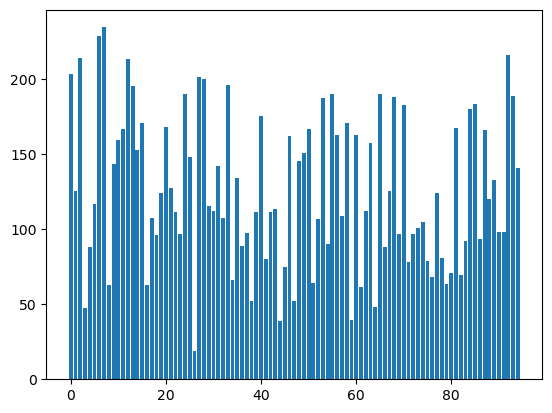

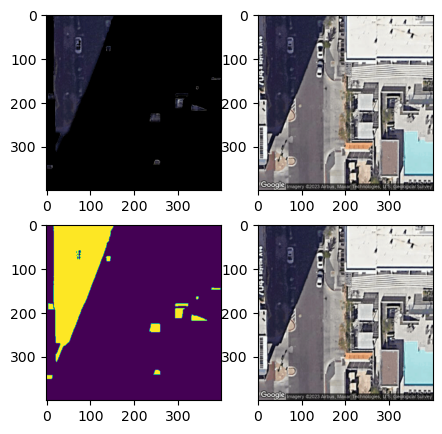

In [23]:
threshold = 70;
totalMask2 = tm.calculateTotalMask(imgPath, threshold)

## Finding how much of a road is covered under shade in an image

In [24]:
imgCoords = imgData['imageIndex'][f"{7}_{7}"];
# Getting the corners for an image
imgLatTop = imgCoords["lat"] + latFactor/2;
imgLatBot = imgCoords["lat"] - latFactor/2;
imgLongLeft = imgCoords["long"] - longFactor/2;
imgLongRight = imgCoords["long"] + longFactor/2;

In [25]:
# Converting image corners to Mercator Projection
(xl, yt) = mp.latLngToPoint(imgLatTop, imgLongLeft);
(xr, yb) = mp.latLngToPoint(imgLatBot, imgLongRight);

In [26]:
(xl, xr)

(48.39951967314996, 48.39971040801324)

In [27]:
# Sampling over the edges of the image, to kind of map the 400 pixels to coordinates
yRange = np.linspace(yt, yb, 400);
xRange = np.linspace(xl, xr, 400);

In [28]:
# Converting end-point coordinates of the road to Mercator projection
imageLinks = [214]
nodePair0 = linkIDToNodePair[214]
path0_node0 = nodeCoordDict[nodePair0[0]];
path0_node1 = nodeCoordDict[nodePair0[1]];
(x0, y0) = mp.latLngToPoint(path0_node0[0], path0_node0[1]);
(x1, y1) = mp.latLngToPoint(path0_node1[0], path0_node1[1]);

In [29]:
totalMask3 = copy.deepcopy(totalMask2)

In [30]:
# All points below are Mercator's Projection.
totalPixelCount = 0;
shadedPixelCount = 0;
for y in yRange:
    leftPoint = (xl, y);
    rightPoint = (xr, y);
    
    # Line parellel to top/bottom edge of the image.
    line1 = (leftPoint, rightPoint);
    
    # Line joining the endpoints of the pathway.
    # top and bottom no relevance to actual position.
    topPoint = (x0, y0);
    bottomPoint = (x1, y1);
    line2 = (topPoint, bottomPoint);
    
    # Calculating intersection point of the 2 lines.
    (xIntersect, yIntersect) = intersect.line_intersection(line1, line2);
    
    # yIntersect should directly correspond to a pixel, as we mapped yRange to 400 pixels.
    # But it might not, as we our finding intersection using equation of line.
    for i in range(1, len(yRange) - 1):
        if(yRange[i-1] < yIntersect  and yRange[i + 1] > yIntersect) :
            yIntersect = yRange[i];
            break;
    # For xIntersect, we check between which two points in xRange does the xIntersect lies,
    # The point in between those 2 points will be our xIntersect pixel in the image.
    for i in range(1, len(xRange) - 1):
        if(xRange[i-1] < xIntersect  and xRange[i + 1] > xIntersect) :
            xIntersect = xRange[i];
            break;
    
    # Checking whether (xIntersect, yIntersect) is under shade
    imagePixelX = np.where(xRange == xIntersect);
    if(len(imagePixelX[0]) != 0):
        imagePixelX = imagePixelX[0][0];
    else:
        imagePixelX = -1;
        
    imagePixelY = np.where(yRange == yIntersect);
    if(len(imagePixelY[0]) != 0):
        imagePixelY = imagePixelY[0][0];
    else:
        imagePixelY = -1;
    
#     print(imagePixelX, imagePixelY)
    
    # Implies that point lies within the image
    if(imagePixelX != -1 and imagePixelY != -1):
        totalPixelCount += 1;
        # Checking if the point is also under shade
        if(totalMask2[imagePixelY, imagePixelX] == True):
            totalMask3[imagePixelY, imagePixelX] = False;
            shadedPixelCount += 1;
        
percentageCoverage = (shadedPixelCount / totalPixelCount) * 100

In [31]:
percentageCoverage

73.43358395989975

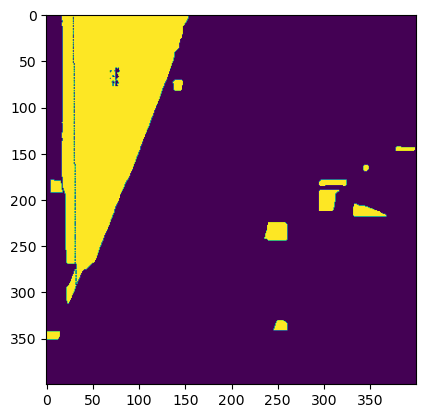

In [32]:
plt.imshow(totalMask3)

In [33]:
shadedPixelCount

293

In [34]:
totalPixelCount

399

## Iterating over all images to find shaded rate of all roads

In [26]:
# For each road, we store the total pixels in each image for that road.
# And out of those total pixels, how many are in shade.
totalRoadShadeCoverage = {};

(2, 2)
(2, 3)
(2, 4)
(2, 5)
(2, 6)
(2, 7)
(2, 8)
(2, 9)
(3, 2)
(3, 3)
(3, 4)
(3, 5)
(3, 6)
(3, 7)
(3, 8)
(3, 9)
(4, 2)
(4, 3)
(4, 4)
(4, 5)


../Utils/totalShadeMask.py:71: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(5,5))


(4, 6)
(4, 7)
(4, 8)
(4, 9)
(5, 2)
(5, 3)
(5, 4)
(5, 5)
(5, 6)
(5, 7)
(5, 8)
(5, 9)
(6, 2)
(6, 3)
(6, 4)
(6, 5)
(6, 6)
(6, 7)
(6, 8)
(6, 9)
(7, 2)
(7, 3)
(7, 4)
(7, 5)
(7, 6)
(7, 7)
(7, 8)
(7, 9)
(8, 2)
(8, 3)
(8, 4)
(8, 5)
(8, 6)
(8, 7)
(8, 8)
(8, 9)


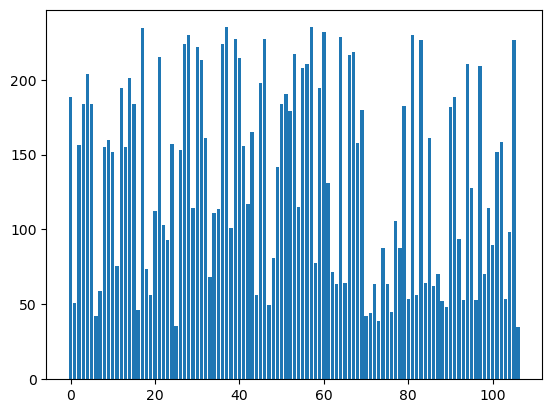

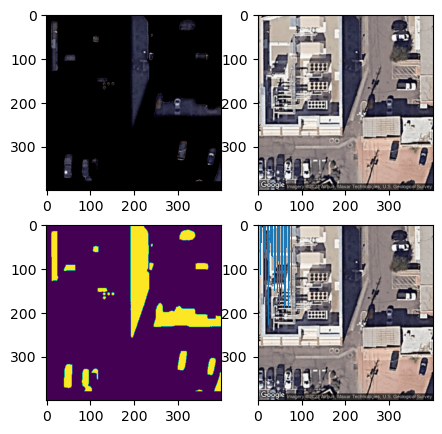

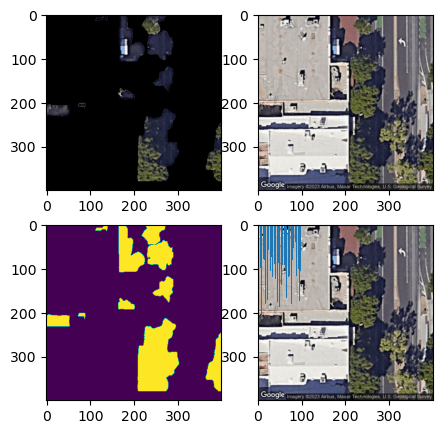

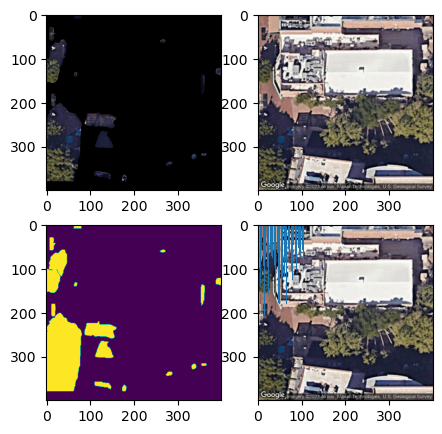

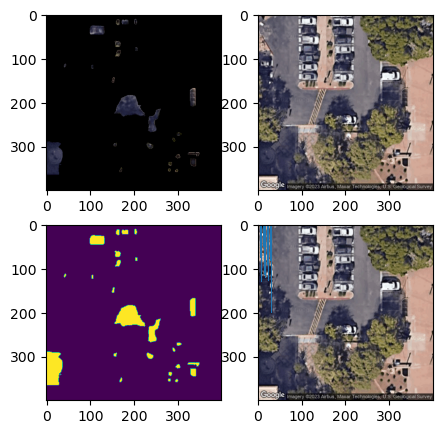

...

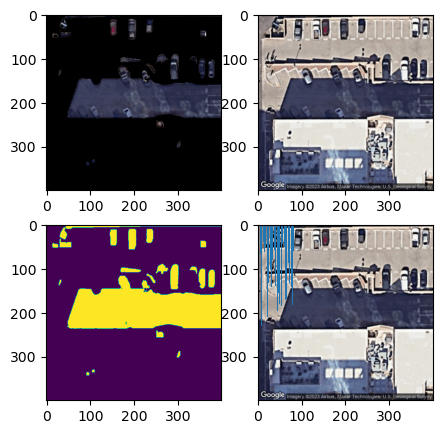

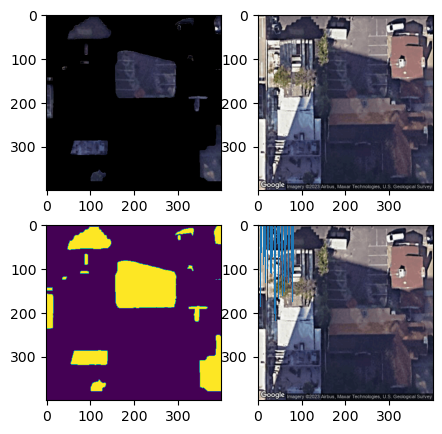

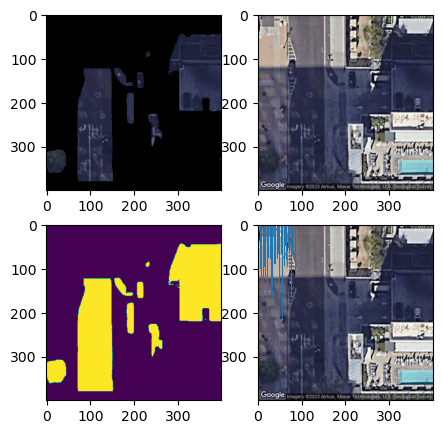

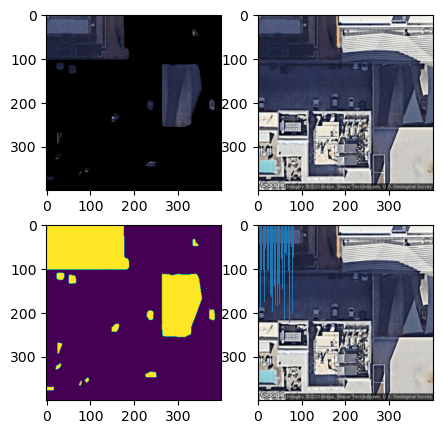

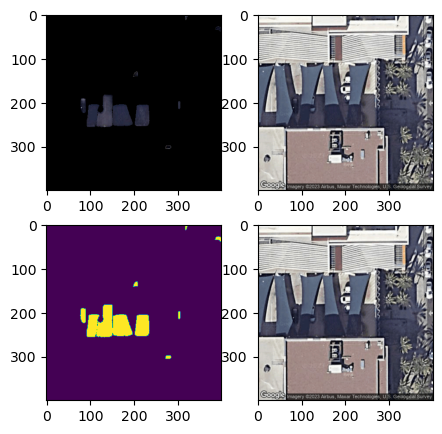

In [28]:
totalMasks = {};
for imageIndex in imageLinksDir:
    print(imageIndex);
    xIndex = imageIndex[0];
    yIndex = imageIndex[1];
    imgCoords = imgData['imageIndex'][f"{xIndex}_{yIndex}"];
    
    imgPath = f"img{xIndex}-{yIndex}.png";
    imgPath = os.path.join(dirPath, imgPath);
    threshold = 70;
    totalMask2 = tm.calculateTotalMask(imgPath, threshold);
    totalMask3 = copy.deepcopy(totalMask2);
    
    # Getting the corners for an image
    imgLatTop = imgCoords["lat"] + latFactor/2;
    imgLatBot = imgCoords["lat"] - latFactor/2;
    imgLongLeft = imgCoords["long"] - longFactor/2;
    imgLongRight = imgCoords["long"] + longFactor/2;
    
    # Converting image corners to Mercator Projection
    (xl, yt) = mp.latLngToPoint(imgLatTop, imgLongLeft);
    (xr, yb) = mp.latLngToPoint(imgLatBot, imgLongRight);
    
    # Sampling over the edges of the image, to kind of map the 400 pixels to coordinates
    yRange = np.linspace(yt, yb, 400);
    xRange = np.linspace(xl, xr, 400);
    
    roadsInImage = imageLinksDir[imageIndex];
    for road in roadsInImage:
        # Converting end-point coordinates of the road to Mercator projection
        nodePair0 = linkIDToNodePair[road]
        path0_node0 = nodeCoordDict[nodePair0[0]];
        path0_node1 = nodeCoordDict[nodePair0[1]];
        (x0, y0) = mp.latLngToPoint(path0_node0[0], path0_node0[1]);
        (x1, y1) = mp.latLngToPoint(path0_node1[0], path0_node1[1]);
        
        # All points below are Mercator's Projection.
        totalPixelCount = 0;
        shadedPixelCount = 0;
        for y in yRange:
            leftPoint = (xl, y);
            rightPoint = (xr, y);

            # Line parellel to top/bottom edge of the image.
            line1 = (leftPoint, rightPoint);

            # Line joining the endpoints of the pathway.
            # top and bottom no relevance to actual position.
            topPoint = (x0, y0);
            bottomPoint = (x1, y1);
            line2 = (topPoint, bottomPoint);

            # Calculating intersection point of the 2 lines.
            (xIntersect, yIntersect) = intersect.line_intersection(line1, line2);
            # If lines don't intersect
            if(math.isnan(xIntersect)):
                continue;

            # yIntersect should directly correspond to a pixel, as we mapped yRange to 400 pixels.
            # But it might not, as we our finding intersection using equation of line.
            for i in range(1, len(yRange) - 1):
                if(yRange[i-1] < yIntersect  and yRange[i + 1] > yIntersect) :
                    yIntersect = yRange[i];
                    break;
            # For xIntersect, we check between which two points in xRange does the xIntersect lies,
            # The point in between those 2 points will be our xIntersect pixel in the image.
            for i in range(1, len(xRange) - 1):
                if(xRange[i-1] < xIntersect  and xRange[i + 1] > xIntersect) :
                    xIntersect = xRange[i];
                    break;

            # Checking whether (xIntersect, yIntersect) is under shade
            imagePixelX = np.where(xRange == xIntersect);
            if(len(imagePixelX[0]) != 0):
                imagePixelX = imagePixelX[0][0];
            else:
                imagePixelX = -1;

            imagePixelY = np.where(yRange == yIntersect);
            if(len(imagePixelY[0]) != 0):
                imagePixelY = imagePixelY[0][0];
            else:
                imagePixelY = -1;

            # print(imagePixelX, imagePixelY)

            # Implies that point lies within the image
            if(imagePixelX != -1 and imagePixelY != -1):
                totalPixelCount += 1;
                # Checking if the point is also under shade
                if(totalMask2[imagePixelY, imagePixelX] == True):
                    totalMask3[imagePixelY, imagePixelX] = False;
                    shadedPixelCount += 1;
            
        if(not(totalRoadShadeCoverage.__contains__(road))):
            totalRoadShadeCoverage[road] = {
                "totalPixels": 0,
                "shadedPixels": 0,
                "percentageCover": 0
            }
        totalRoadShadeCoverage[road]["totalPixels"] += totalPixelCount;
        totalRoadShadeCoverage[road]["shadedPixels"] += shadedPixelCount;
        if(totalRoadShadeCoverage[road]["totalPixels"] == 0):
            percentCover = 0
        else:
            percentCover = (totalRoadShadeCoverage[road]["shadedPixels"] / totalRoadShadeCoverage[road]["totalPixels"]) * 100;
        totalRoadShadeCoverage[road]["percentageCover"] = percentCover
    totalMasks[imageIndex] = totalMask3;
    

In [29]:
totalRoadShadeCoverage

{479: {'totalPixels': 399,
  'shadedPixels': 32,
  'percentageCover': 8.020050125313283},
 480: {'totalPixels': 399,
  'shadedPixels': 32,
  'percentageCover': 8.020050125313283},
 170: {'totalPixels': 799, 'shadedPixels': 0, 'percentageCover': 0.0},
 556: {'totalPixels': 799,
  'shadedPixels': 357,
  'percentageCover': 44.680851063829785},
 281: {'totalPixels': 89,
  'shadedPixels': 13,
  'percentageCover': 14.606741573033707},
 115: {'totalPixels': 493,
  'shadedPixels': 72,
  'percentageCover': 14.60446247464503},
 282: {'totalPixels': 1, 'shadedPixels': 0, 'percentageCover': 0.0},
 295: {'totalPixels': 399, 'shadedPixels': 0, 'percentageCover': 0.0},
 296: {'totalPixels': 399, 'shadedPixels': 0, 'percentageCover': 0.0},
 297: {'totalPixels': 399,
  'shadedPixels': 50,
  'percentageCover': 12.531328320802004},
 298: {'totalPixels': 399,
  'shadedPixels': 50,
  'percentageCover': 12.531328320802004},
 635: {'totalPixels': 399, 'shadedPixels': 0, 'percentageCover': 0.0},
 107: {'total

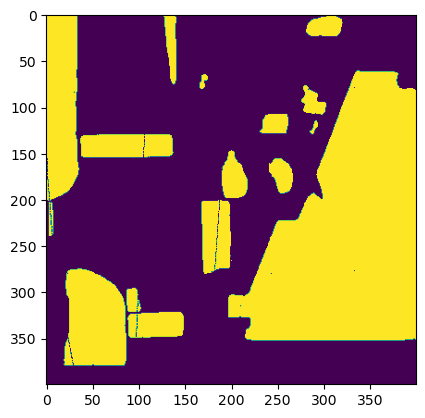

In [37]:
plt.imshow(totalMasks[(6, 7)])

In [43]:
totalMaskWithRoads = [];

for i in range(2, 9):
    
    horizontalMask = [];
    
    for j in range(2, 10):
        
        singleMask = totalMasks[(i, j)];
        
        if(horizontalMask == []):
            
                horizontalMask = singleMask;
                
        else:

            horizontalMask = np.hstack([horizontalMask, singleMask]);
                
    if totalMaskWithRoads == []:
        totalMaskWithRoads = horizontalMask;
    else:
        totalMaskWithRoads = np.vstack([totalMaskWithRoads, horizontalMask]);

/var/folders/sp/p58zvn2x0j74k4wxmrwnyh7h0000gn/T/ipykernel_23548/237214468.py:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if(horizontalMask == []):
/var/folders/sp/p58zvn2x0j74k4wxmrwnyh7h0000gn/T/ipykernel_23548/237214468.py:19: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if totalMaskWithRoads == []:


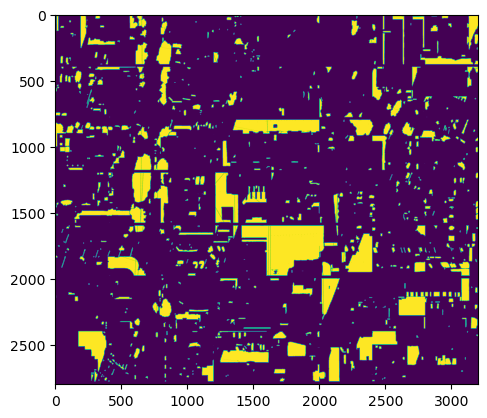

In [57]:
plt.imshow(totalMaskWithRoads)
plt.savefig("totalShadeMaskImage", dpi=700)

## Data shading

In [1]:
import datashader as ds, pandas as pd, colorcet
df  = pd.read_csv('census.csv')
cvs = ds.Canvas(plot_width=850, plot_height=500)
agg = cvs.points(df, 'longitude', 'latitude')
img = ds.tf.shade(agg, cmap=colorcet.fire, how='log')

FileNotFoundError: [Errno 2] No such file or directory: 'census.csv'

In [3]:
datashader examples
cd datashader-examples

SyntaxError: invalid syntax (590869760.py, line 1)